# Pipeline Check

This notebook checks the proposed structure in *One-to-many Conversion for Percussive Samples*.

In [1]:
from utils import print_audio_info
from pipeline import pipeline

import numpy as np
import numpy.typing as npt
import scipy.signal as signal
import scipy.io as sio
from IPython.display import display, Audio

import matplotlib.pyplot as plt

## Read Samples

In [2]:
hihat_file = './audio/hihat.wav'
hihat_sr, hihat_data = sio.wavfile.read(hihat_file)
hihat_data = hihat_data.T
print_audio_info('Hihat', hihat_data, hihat_sr)
display(Audio(data=hihat_data, rate=hihat_sr))

Hihat sample. Sample rate 44100. Data type int16. Has 2 channels. Has 14705 samples.


In [3]:
snare_file = './audio/snare.wav'
snare_sr, snare_data = sio.wavfile.read(snare_file)
snare_data = snare_data.T
print_audio_info('Snare', snare_data, snare_sr)
display(Audio(data=snare_data, rate=snare_sr))

Snare sample. Sample rate 44100. Data type int16. Has 2 channels. Has 44100 samples.


## Apply Effects to Audio

In [4]:
hihat_out = pipeline(hihat_data, hihat_sr, fc=50, G=-20.0, Q=5.0, Ls=30, M=8, LdB=-20, gain=0.5)
hihat_org = hihat_data.copy()
for _ in range(20):
    hihat_out = np.hstack([hihat_out, pipeline(hihat_data, hihat_sr, fc=50, G=-20.0, Q=5.0, Ls=30, M=8, LdB=-20, gain=0.5)])
    hihat_org = np.hstack([hihat_org, hihat_data])

In [5]:
display(Audio(data=hihat_out, rate=hihat_sr))
display(Audio(data=hihat_org, rate=hihat_sr))

In [6]:
snare_out = pipeline(snare_data, hihat_sr, fc=50, G=-20.0, Q=5.0, Ls=30, M=8, LdB=-20, gain=0.5)
snare_org = snare_data.copy()
for _ in range(20):
    snare_out = np.hstack([snare_out, pipeline(snare_data, hihat_sr, fc=50, G=-20.0, Q=5.0, Ls=30, M=8, LdB=-20, gain=0.5)])
    snare_org = np.hstack([snare_org, snare_data])

In [7]:
display(Audio(data=snare_out, rate=hihat_sr))
display(Audio(data=snare_org, rate=hihat_sr))

# Test E2E IR 

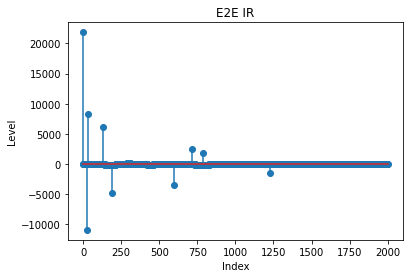

In [8]:
impulse = np.zeros_like(snare_data)
impulse[:, 0] = 32767
o = pipeline(impulse, hihat_sr, fc=50, G=-20.0, Q=4.0, Ls=30, M=8, LdB=-20, gain=0.5)[0]
plt.stem(o[:2000])
plt.title('E2E IR')
plt.xlabel('Index')
plt.ylabel('Level')
plt.show()